In [ ]:
# import torch
# from models import CombinedRULModel
# from sklearn.preprocessing import OrdinalEncoder
# import pandas as pd
# import torch
# import torch.nn as nn
# from tab_transformer_pytorch import TabTransformer





# NUM_SENSOR_FEATURES = 105     # e.g. number of sensor channels
# CONTEXT_LENGTH      = 70      # length of each window
# CONTINUOUS_DIM      = 128     # embedding dimension output by TimeSeriesEmbedder

# #  Re‐produce the category sizes from your training-time encoder:
# #    Read the same specs CSV and fit an OrdinalEncoder to reconstruct category cardinalities.
# spec_df = pd.read_csv(r"C:\Users\ASUS\Desktop\SCANIA\2024-34-2\2024-34-2\data\train_specifications.csv")
# spec_columns = [f"Spec_{i}" for i in range(8)]
# encoder = OrdinalEncoder()
# spec_df[spec_columns] = encoder.fit_transform(spec_df[spec_columns])
# category_sizes = tuple(len(encoder.categories_[i]) for i in range(8))  # 3,3,5,...)

# # # 3. Instantiate a fresh model
# # model = CombinedRULModel(
# #     num_sensor_features=NUM_SENSOR_FEATURES,
# #     context_length=CONTEXT_LENGTH,
# #     categories=category_sizes,
# #     continuous_dim=CONTINUOUS_DIM,
# #     cont_mean_std=None        # or supply the same tensor you used in training
# # )



# # class TimeSeriesEmbedder(nn.Module):
# #     """
# #     Takes as input a batch of raw sensor-windows shaped (batch, context_length, num_features),
# #     applies a small TransformerEncoder, and returns a single d_model-dim vector per window
# #     by taking the last time-step embedding (instead of mean pooling).
# #     """
# #     def __init__(self, num_features: int, d_model: int = 128, n_heads: int = 8, num_layers: int = 2, dropout: float = 0.1):
# #         super().__init__()
# #         # 1) Linear projection from num_features → d_model
# #         self.input_proj = nn.Linear(num_features, d_model)

# #         # 2) TransformerEncoder (batch_first=True)
# #         encoder_layer = nn.TransformerEncoderLayer(
# #             d_model=d_model,
# #             nhead=n_heads,
# #             dropout=dropout,
# #             batch_first=True
# #         )
# #         self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

# #         # 3) LayerNorm after the encoder
# #         # self.layer_norm = nn.LayerNorm(d_model)

# #     def forward(self, x: torch.Tensor) -> torch.Tensor:
# #         """
# #         x: (batch_size, context_length, num_features)
# #         returns: (batch_size, d_model)
# #         """
# #         # 1) Project each time-step’s features into d_model
# #         x = self.input_proj(x)          # → (batch, context_length, d_model)

# #         # 2) Feed into standard PyTorch TransformerEncoder
# #         x = self.encoder(x)             # → (batch, context_length, d_model)

# #         # 3) Take the last-time-step embedding instead of mean:
# #         x = x[:, -1, :]                 # → (batch, d_model)

# #         # 4) Apply LayerNorm
# #         # x = self.layer_norm(x)          # → (batch, d_model)

# #         return x


# # class CombinedRULModel(nn.Module):
# #     """
# #     Combines:
# #       (a) TimeSeriesEmbedder  → raw (batch, 70, 105) → (batch, 128)
# #       (b) TabTransformer      → (batch, 8 categorical) + (batch, 128 continuous) → (batch, 1) RUL regression
# #     """
# #     def __init__(
# #         self,
# #         num_sensor_features: int,        # e.g. 105
# #         context_length: int,             # e.g. 70
# #         categories: tuple,               # cardinalities of each Spec_i column (length 8)
# #         continuous_dim: int = 128,       # must match TimeSeriesEmbedder’s output size
# #         cont_mean_std: torch.Tensor = None
# #     ):
# #         super().__init__()

# #         # 1) TimeSeriesEmbedder
# #         self.tf = TimeSeriesEmbedder(
# #             num_features=num_sensor_features,
# #             d_model=continuous_dim,
# #             n_heads=8,
# #             num_layers=2,
# #             dropout=0.1
# #         )

# #         # 2) TabTransformer
# #         #    If cont_mean_std is None, TabTransformer will assume (mean=0, std=1)
# #         if cont_mean_std is None:
# #             cont_mean_std = torch.stack([
# #                 torch.zeros(continuous_dim),
# #                 torch.ones(continuous_dim)
# #             ], dim=1)  # shape: (continuous_dim, 2)

# #         self.tabtf = TabTransformer(
# #             categories=categories,              # tuple of 8 ints
# #             num_continuous=continuous_dim,      # 128
# #             dim=continuous_dim,                 # identical to continuous_dim
# #             dim_out=1,                          # regression → 1 scalar
# #             depth=6,
# #             heads=8,
# #             attn_dropout=0.1,
# #             ff_dropout=0.1,
# #             mlp_hidden_mults=(4, 2),
# #             mlp_act=nn.ReLU(),
# #             # continuous_mean_std is commented out per your edited code
# #             continuous_mean_std=cont_mean_std
# #         )

# #     def forward(self, x_cat: torch.Tensor, x_ts: torch.Tensor) -> torch.Tensor:
# #         """
# #         x_cat: (batch_size, 8)        # each Spec_i is a LongTensor index
# #         x_ts:  (batch_size, context_length, num_sensor_features)
# #         Returns:
# #           - pred: (batch_size, 1)      # predicted RUL
# #         """
# #         # 1) Compute 128-dim continuous embedding from raw window
# #         cont_embed = self.tf(x_ts)         # → (batch, 128)

# #         # 2) Feed categorical specs + continuous embedding to TabTransformer
# #         pred = self.tabtf(x_cat, cont_embed)  # → (batch, 1)
# #         return pred



# model = CombinedRULModel(
#         num_sensor_features=105,
#         context_length=70,
#         categories=category_sizes,
#         continuous_dim=128,
#         cont_mean_std=None
#     )
# # .to(DEVICE)









# import os


# parent = os.path.abspath("")
# print(parent)  # For debugging; can be removed in production

# def make_path(relative_path: str) -> str:
#     """
#     Helper to join the project’s parent folder with a relative subpath.
#     Example: make_path("data/train_specifications.csv")
#     will return "<absolute_parent>/data/train_specifications.csv".
#     """
#     return os.path.join(parent, relative_path)


# # artifact_path = r"C:\Users\ASUS\Desktop\SCANIA\2024-34-2\2024-34-2\Code2\ModularApproach\artifacts"
# # csv_path = make_path(os.path.join("data", "super_same_norm.csv"))

# # spec_csv_rel = os.path.join("data", "train_specifications.csv")
# # model_timestep=CombinedRULModel-20250606_032201
# # model_timestep=CombinedRULModel-20250606_032600
# # model_timestep=CombinedRULModel-20250606_032927
# model_timestep="CombinedRULModel-20250606_034419"





# checkpoint_path=make_path(os.path.join("artifacts", model_timestep, "checkpoint.pth"))










# # 4. Load the checkpoint
# # checkpoint_path = r"C:\Users\ASUS\Desktop\SCANIA\2024-34-2\2024-34-2\Code2\ModularApproach\artifacts\CombinedRULModel-20250606_034419\checkpoint.pth"
# state_dict = torch.load(checkpoint_path, map_location=torch.device("cpu"))
# model.load_state_dict(state_dict)

# # 5. Set to eval mode if doing inference
# model.eval()

# # 6. (Optional) move to GPU if available
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device)

# print("Checkpoint loaded! Model ready for inference or further fine‐tuning.")












Checkpoint loaded! Model ready for inference or further fine‐tuning.


In [ ]:
import torch
from models import CombinedRULModel
from sklearn.preprocessing import OrdinalEncoder
import pandas as pd
import torch
import torch.nn as nn
from tab_transformer_pytorch import TabTransformer





# NUM_SENSOR_FEATURES = 105     # e.g. number of sensor channels
# CONTEXT_LENGTH      = 70      # length of each window
# CONTINUOUS_DIM      = 128     # embedding dimension output by TimeSeriesEmbedder

#  Re‐produce the category sizes from your training-time encoder:
#    Read the same specs CSV and fit an OrdinalEncoder to reconstruct category cardinalities.
spec_df = pd.read_csv(r"C:\Users\ASUS\Desktop\SCANIA\2024-34-2\2024-34-2\data\train_specifications.csv")
spec_columns = [f"Spec_{i}" for i in range(8)]
encoder = OrdinalEncoder()
spec_df[spec_columns] = encoder.fit_transform(spec_df[spec_columns])
category_sizes = tuple(len(encoder.categories_[i]) for i in range(8))  # 3,3,5,...)

# 3. Instantiate a fresh model-->its done below
# model = CombinedRULModel(
#     num_sensor_features=NUM_SENSOR_FEATURES,
#     context_length=CONTEXT_LENGTH,
#     categories=category_sizes,
#     continuous_dim=CONTINUOUS_DIM,
#     cont_mean_std=None        # or supply the same tensor you used in training
# )



# model = CombinedRULModel(
#         num_sensor_features=105,
#         context_length=70,
#         categories=category_sizes,
#         continuous_dim=128,
#         cont_mean_std=None
#     )
# # .to(DEVICE)




import os


parent = os.path.abspath("")
print(parent)  # For debugging; can be removed in production

def make_path(relative_path: str) -> str:
    """
    Helper to join the project’s parent folder with a relative subpath.
    Example: make_path("data/train_specifications.csv")
    will return "<absolute_parent>/data/train_specifications.csv".
    """
    return os.path.join(parent, relative_path)


# artifact_path = r"C:\Users\ASUS\Desktop\SCANIA\2024-34-2\2024-34-2\Code2\ModularApproach\artifacts"
# csv_path = make_path(os.path.join("data", "super_same_norm.csv"))\



# spec_csv_rel = os.path.join("data", "train_specifications.csv")

# model_timestep=CombinedRULModel-20250606_032201
# model_timestep=CombinedRULModel-20250606_032600
# model_timestep=CombinedRULModel-20250606_032927
model_timestep="CombinedRULModel-20250606_034419"



import json

checkpoint_path=make_path(os.path.join("artifacts", model_timestep, "checkpoint.pth"))
metadata_path = os.path.join("artifacts",model_timestep, "metadata.json")

with open(metadata_path, "r") as f:
    metadata = json.load(f)


model_name        = metadata["model_name"]               # Just for logging or future use
num_sensor_feats  = metadata["num_sensor_features"]
context_len       = metadata["context_length"]
cont_dim          = metadata["continuous_dim"]
categories        = tuple(metadata["categories"])        # Must be tuple not list


model = CombinedRULModel(
    num_sensor_features=num_sensor_feats,
    context_length=context_len,
    categories=categories,
    continuous_dim=cont_dim,
    cont_mean_std=None     # Replace if you saved normalization stats
)





# 4. Load the checkpoint
# checkpoint_path = r"C:\Users\ASUS\Desktop\SCANIA\2024-34-2\2024-34-2\Code2\ModularApproach\artifacts\CombinedRULModel-20250606_034419\checkpoint.pth"
state_dict = torch.load(checkpoint_path, map_location=torch.device("cpu"))
model.load_state_dict(state_dict)

# 5. Set to eval mode if doing inference
model.eval()

# 6. (Optional) move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

print("Checkpoint loaded! Model ready for inference or further fine‐tuning.")




c:\Users\ASUS\Desktop\SCANIA\2024-34-2\2024-34-2\Code2\ModularApproach
Checkpoint loaded! Model ready for inference or further fine‐tuning.


In [2]:
import os
parent = os.path.abspath("")
print(parent)  # For debugging; can be removed in production


c:\Users\ASUS\Desktop\SCANIA\2024-34-2\2024-34-2\Code2\ModularApproach


In [3]:

model.eval()

# Print weights and biases per layer
print("Model Weights Per Layer:\n")
for name, param in model.named_parameters():
    if param.requires_grad:
        print(f"Layer: {name}")
        print(f"Shape: {param.shape}")
        print(param.data)  # or .cpu().numpy() if needed
        print("-" * 60)


Model Weights Per Layer:

Layer: tf.input_proj.weight
Shape: torch.Size([128, 105])
tensor([[-5.4797e-02,  4.5382e-02, -3.9029e-03,  ..., -1.0664e-05,
         -3.1693e-02,  1.2724e-01],
        [ 7.2158e-02,  1.2580e-01, -4.1588e-02,  ...,  5.9355e-02,
         -9.3813e-02, -1.7530e-02],
        [ 9.4033e-02, -6.9460e-02,  8.1434e-02,  ..., -8.5829e-02,
          7.4661e-02,  1.0515e-01],
        ...,
        [-5.9709e-02,  4.9347e-02, -8.6674e-02,  ...,  5.8718e-02,
          1.0115e-01, -3.4090e-02],
        [-2.3697e-02, -4.1557e-02, -2.5854e-02,  ..., -4.1023e-03,
          6.7191e-02, -1.7133e-02],
        [ 8.6532e-02,  2.9635e-02,  6.0904e-02,  ..., -2.6637e-02,
         -5.2242e-02, -9.1374e-02]], device='cuda:0')
------------------------------------------------------------
Layer: tf.input_proj.bias
Shape: torch.Size([128])
tensor([ 0.0242,  0.0683, -0.0410,  0.0756,  0.0153, -0.0767,  0.0122,  0.0472,
         0.0381, -0.0229,  0.0066,  0.0340,  0.0769, -0.0271, -0.0499, -0.0

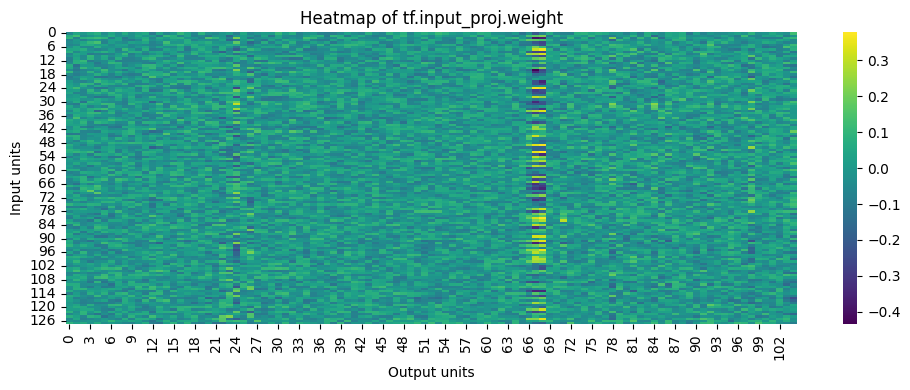

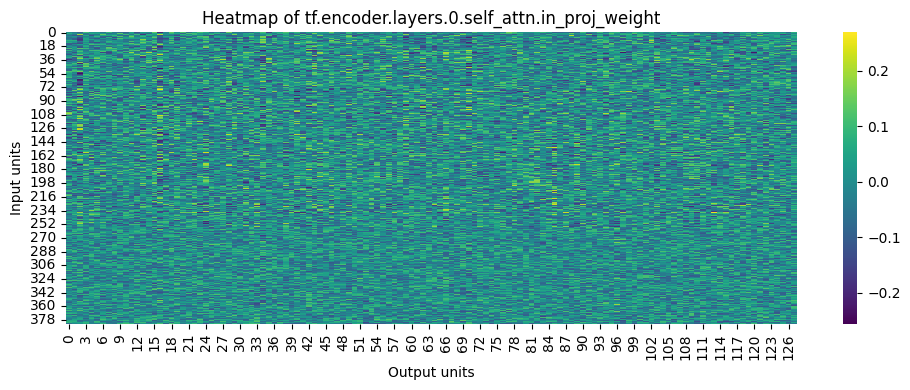

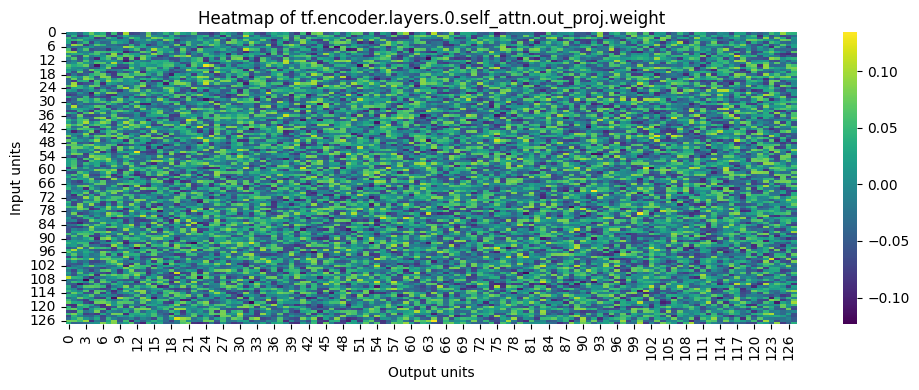

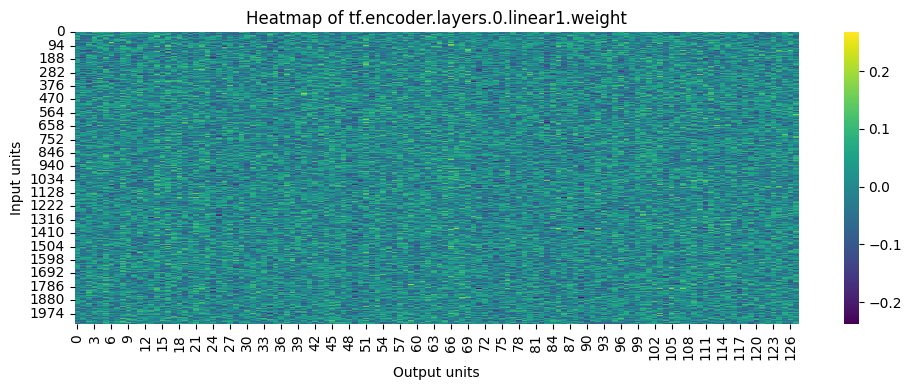

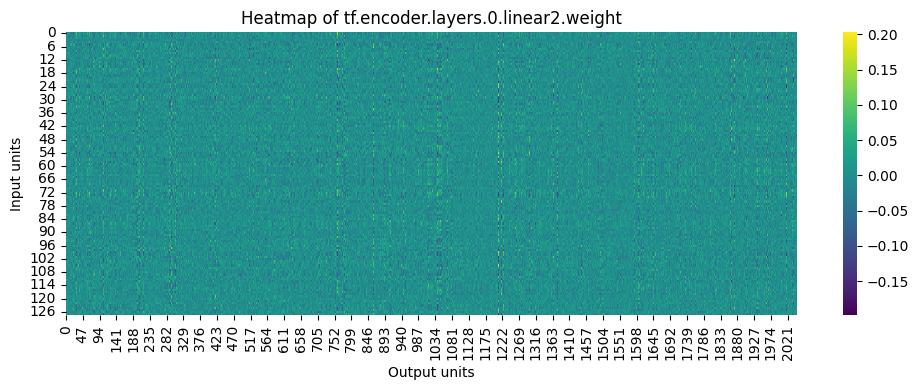

...

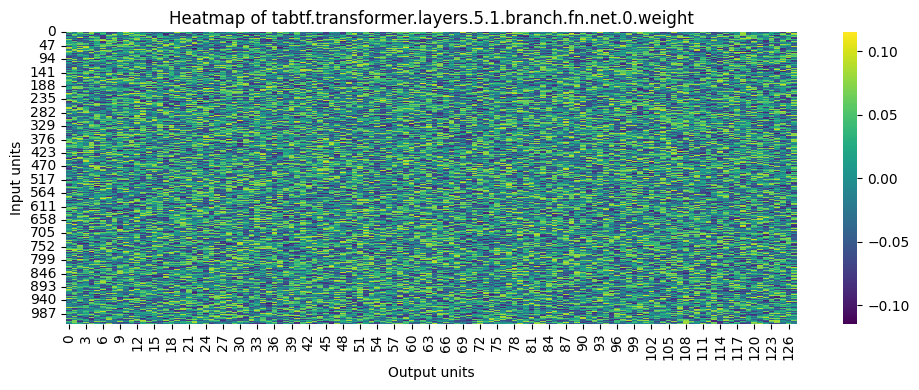

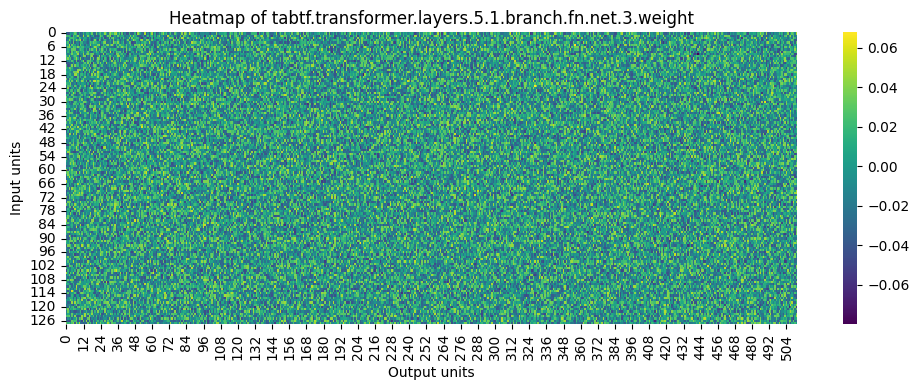

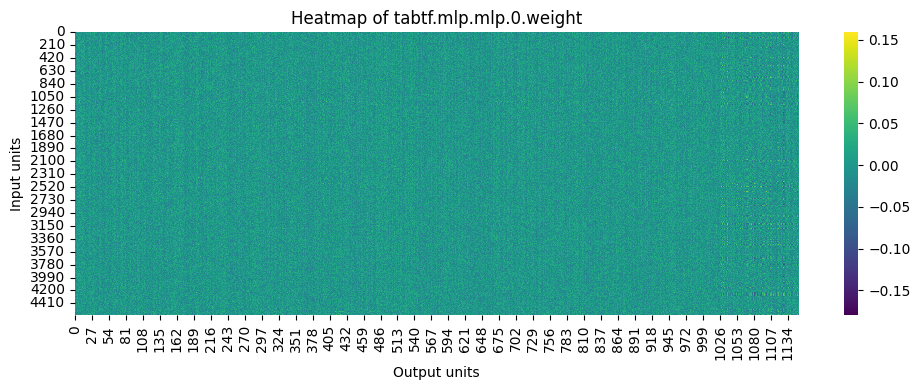

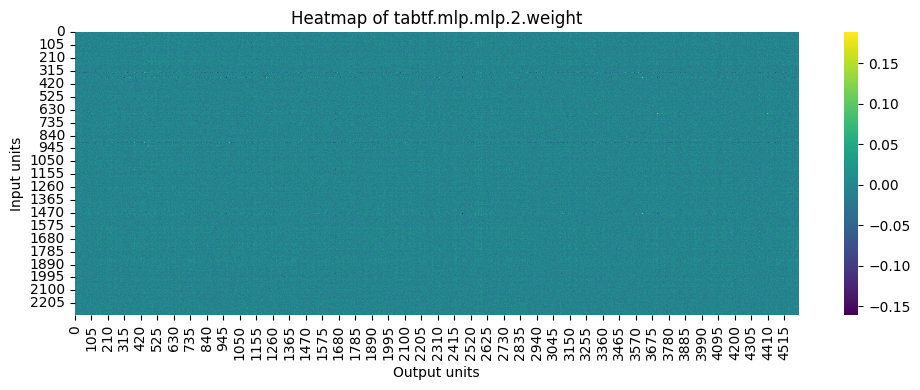

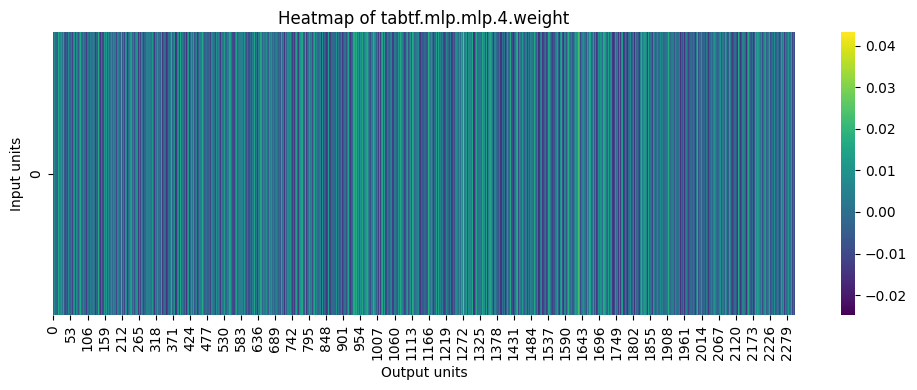

In [2]:

# model = YourModelClass()
# model.load_state_dict(torch.load("model.pth"))  # use the correct path
model.eval()
import matplotlib.pyplot as plt
import seaborn as sns
# Visualize weights
def visualize_weights(model):
    for name, param in model.named_parameters():
        if 'weight' in name and param.requires_grad:
            weights = param.data.cpu().numpy()

            plt.figure(figsize=(10, 4))
            if weights.ndim == 2:
                sns.heatmap(weights, cmap="viridis", cbar=True)
                plt.title(f'Heatmap of {name}')
                plt.xlabel("Output units")
                plt.ylabel("Input units")
            else:
                plt.plot(weights)
                plt.title(f'Weights of {name}')
                plt.xlabel("Index")
                plt.ylabel("Weight value")
            plt.tight_layout()
            plt.show()

visualize_weights(model)




In [3]:
for param in model.parameters():
    print(param, param.shape, param.requires_grad)


Parameter containing:
tensor([[-5.4797e-02,  4.5382e-02, -3.9029e-03,  ..., -1.0664e-05,
         -3.1693e-02,  1.2724e-01],
        [ 7.2158e-02,  1.2580e-01, -4.1588e-02,  ...,  5.9355e-02,
         -9.3813e-02, -1.7530e-02],
        [ 9.4033e-02, -6.9460e-02,  8.1434e-02,  ..., -8.5829e-02,
          7.4661e-02,  1.0515e-01],
        ...,
        [-5.9709e-02,  4.9347e-02, -8.6674e-02,  ...,  5.8718e-02,
          1.0115e-01, -3.4090e-02],
        [-2.3697e-02, -4.1557e-02, -2.5854e-02,  ..., -4.1023e-03,
          6.7191e-02, -1.7133e-02],
        [ 8.6532e-02,  2.9635e-02,  6.0904e-02,  ..., -2.6637e-02,
         -5.2242e-02, -9.1374e-02]], device='cuda:0', requires_grad=True) torch.Size([128, 105]) True
Parameter containing:
tensor([ 0.0242,  0.0683, -0.0410,  0.0756,  0.0153, -0.0767,  0.0122,  0.0472,
         0.0381, -0.0229,  0.0066,  0.0340,  0.0769, -0.0271, -0.0499, -0.0036,
         0.0019, -0.0631,  0.0470,  0.0192, -0.0031, -0.0885, -0.0676,  0.0471,
         0.0686, -0